$\Huge Computational$ $\Huge Intelligence$ $\Huge Lab$

$\Huge  Assignment$ $\Huge 5$
---
Katarzyna Wilk gr 2
---

# 5.1 Reuse horses or humans classifier

In [ ]:
import tensorflow_datasets as tfds
import tensorflow as tf
ds_train = tfds.load('horses_or_humans', split='train', as_supervised=True, shuffle_files=False)
ds_test = tfds.load('horses_or_humans', split='test', as_supervised=True, shuffle_files=False)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/1027 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/horses_or_humans/3.0.0.incompleteQB01U8/horses_or_humans-train.tfrecord*..…

Generating test examples...:   0%|          | 0/256 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/horses_or_humans/3.0.0.incompleteQB01U8/horses_or_humans-test.tfrecord*...…

Dataset horses_or_humans downloaded and prepared to /root/tensorflow_datasets/horses_or_humans/3.0.0. Subsequent calls will reuse this data.


**TODO 5.1.1** Use your own previously developed classifier model. Train it (without augmentation) and save with model.save(filename).

For demonstration puproses we will download a previously trained model (which was used in lab 4),

In [ ]:
#!wget https://dysk.agh.edu.pl/s/GjAmDmiCKM9dQcP/download/horses_or_humans_cnn.h5

--2024-06-01 11:37:29--  https://dysk.agh.edu.pl/s/GjAmDmiCKM9dQcP/download/horses_or_humans_cnn.h5
Resolving dysk.agh.edu.pl (dysk.agh.edu.pl)... 149.156.96.4, 2001:6d8:10:1060::6004
Connecting to dysk.agh.edu.pl (dysk.agh.edu.pl)|149.156.96.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/octet-stream]
Saving to: ‘horses_or_humans_cnn.h5.2’

horses_or_humans_cn     [      <=>           ]  13.07M  9.37MB/s    in 1.4s    

2024-06-01 11:37:32 (9.37 MB/s) - ‘horses_or_humans_cnn.h5.2’ saved [13707104]



In [ ]:
from keras.models import load_model
model = load_model('/content/my_model.h5')

model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 298, 298, 16)      448       
                                                                 
 max_pooling2d_20 (MaxPooli  (None, 149, 149, 16)      0         
 ng2D)                                                           
                                                                 
 dropout_24 (Dropout)        (None, 149, 149, 16)      0         
                                                                 
 conv2d_21 (Conv2D)          (None, 147, 147, 16)      2320      
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 73, 73, 16)        0         
 ng2D)                                                           
                                                                 
 dropout_25 (Dropout)        (None, 73, 73, 16)      

**TODO 5.1.2** Test it on ds_test. Don't forget the preprocessing part. At least indicate that you intend to uses batches! This model expects batches (the additional first dimension).

In [ ]:
loss, acc = model.evaluate(ds_test.batch(32))
print("Accuracy", acc)

8/8 [==============================] - 3s 45ms/step - loss: 7.5937 - accuracy: 0.6992
Accuracy 0.69921875


**TODO 5.1.3** Test it on an image taken from ds_train

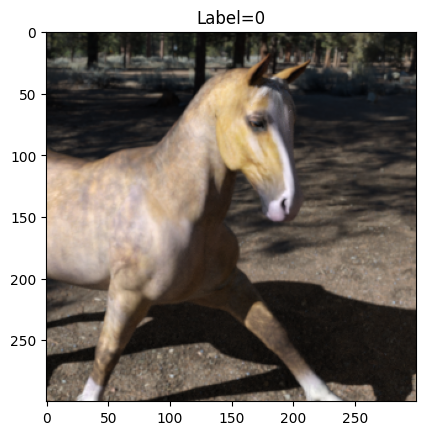

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# This was the 8-th image in ds_train
#tf.enable_eager_execution()

image, label = ds_train.take(1).as_numpy_iterator().next()
plt.title(f'Label={label}')
plt.imshow(image)

Predict the output label... Be sure that the image has additional batch dimension

In [ ]:
print(image.shape)
image = np.expand_dims(image,axis=0)
print(image.shape)


(300, 300, 3)
(1, 300, 300, 3)


In [ ]:
preds = model.predict(image)
print(preds)

1/1 [==============================] - 0s 460ms/step
[[0.01946906 0.980531  ]]


In [ ]:
y_pred = np.argmax(preds)
print(f'Predicted:{y_pred}')

Predicted:1


# 5.2 Display layer activations

Collect layer names. **Those are the layer names in the model used as an example. In your model the names are probably different**

In [ ]:
layer_names = [l.name for l in model.layers]
print(layer_names)

['conv2d_20', 'max_pooling2d_20', 'dropout_24', 'conv2d_21', 'max_pooling2d_21', 'dropout_25', 'conv2d_22', 'max_pooling2d_22', 'dropout_26', 'conv2d_23', 'max_pooling2d_23', 'dropout_27', 'conv2d_24', 'max_pooling2d_24', 'dropout_28', 'flatten_4', 'dense_8', 'dropout_29', 'dense_9']


Collect layer outputs of the model into a new activation_model, which for a given input image produces multiple outputs

In [ ]:
from keras import models

# Extracts the outputs of the first 14 layers:
# The exaxct number depends on the model!
layer_outputs = [layer.output for layer in model.layers[:14]]

# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

Supply the image and read activations... Then inspect the result.

In [ ]:
activations = activation_model.predict(image)
print(len(activations))

for i,a in enumerate(activations):
  print(f'{layer_names[i]} : {a.shape}')

1/1 [==============================] - 0s 153ms/step
14
conv2d_20 : (1, 298, 298, 16)
max_pooling2d_20 : (1, 149, 149, 16)
dropout_24 : (1, 149, 149, 16)
conv2d_21 : (1, 147, 147, 16)
max_pooling2d_21 : (1, 73, 73, 16)
dropout_25 : (1, 73, 73, 16)
conv2d_22 : (1, 71, 71, 32)
max_pooling2d_22 : (1, 35, 35, 32)
dropout_26 : (1, 35, 35, 32)
conv2d_23 : (1, 33, 33, 32)
max_pooling2d_23 : (1, 16, 16, 32)
dropout_27 : (1, 16, 16, 32)
conv2d_24 : (1, 14, 14, 64)
max_pooling2d_24 : (1, 7, 7, 64)


We will define a function that will display a grid of activations for each channel... As you may observe the numbers of filters, hence channels, differ. Use grid_shape to adjust layout and number of filters.

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

def display(tensor,grid_shape=(4,4),start=0,title=None):
  fig = plt.figure(figsize=(grid_shape[1]*2, grid_shape[0]*2))
  grid = ImageGrid(fig, 111,  # similar to subplot(111)
                  nrows_ncols=grid_shape,  # creates 2x2 grid of axes
                  axes_pad=0.05,  # pad between axes in inch.
                  )
  images = [tensor[0, :, :, start+i] for i in range(grid_shape[0]*grid_shape[1])]
  for ax, im in zip(grid, images):
      # Iterating over the grid returns the Axes.
      ax.imshow(im,cmap='viridis')
      ax.axis('off')

  # fig.tight_layout()
  # fig.subplots_adjust(top=0.95)
  if title is not None:
    plt.suptitle(title)
    print('-----')
  plt.show()


**TODO 5.2.1** Display activations for all convolution layers

-----


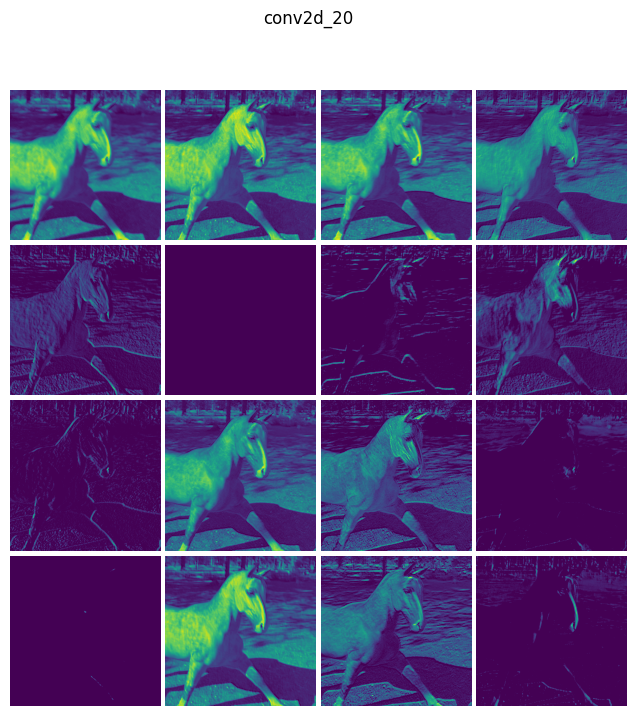

-----


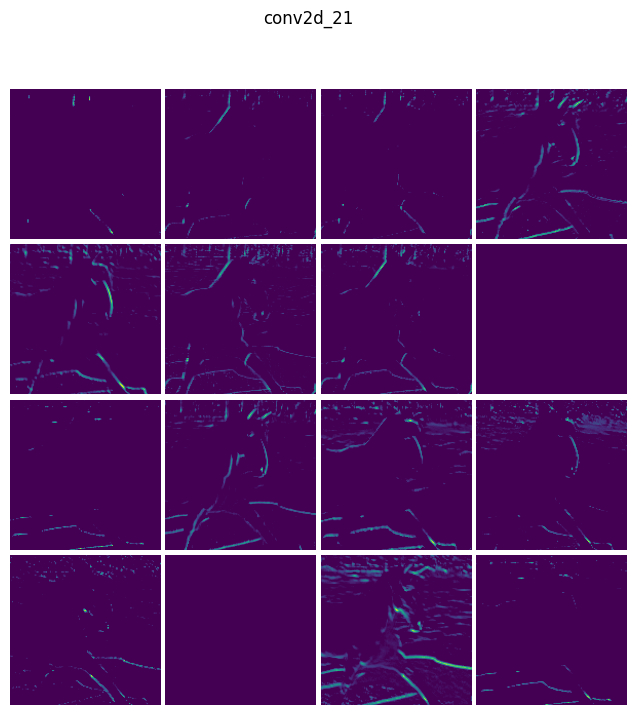

-----


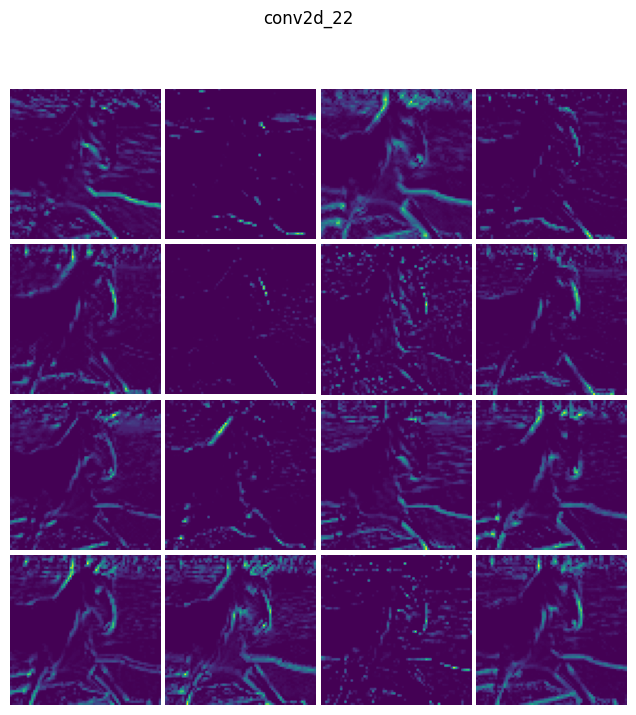

In [ ]:
display(activations[0],grid_shape=(4,4),title=layer_names[0])
display(activations[3],grid_shape=(4,4),title=layer_names[3])
display(activations[6],grid_shape=(4,4),title=layer_names[6])
# etc...

## 5.2.1 Test on a horse
**TODO 5.2.2** Load a horse photo, perform classification and display activations

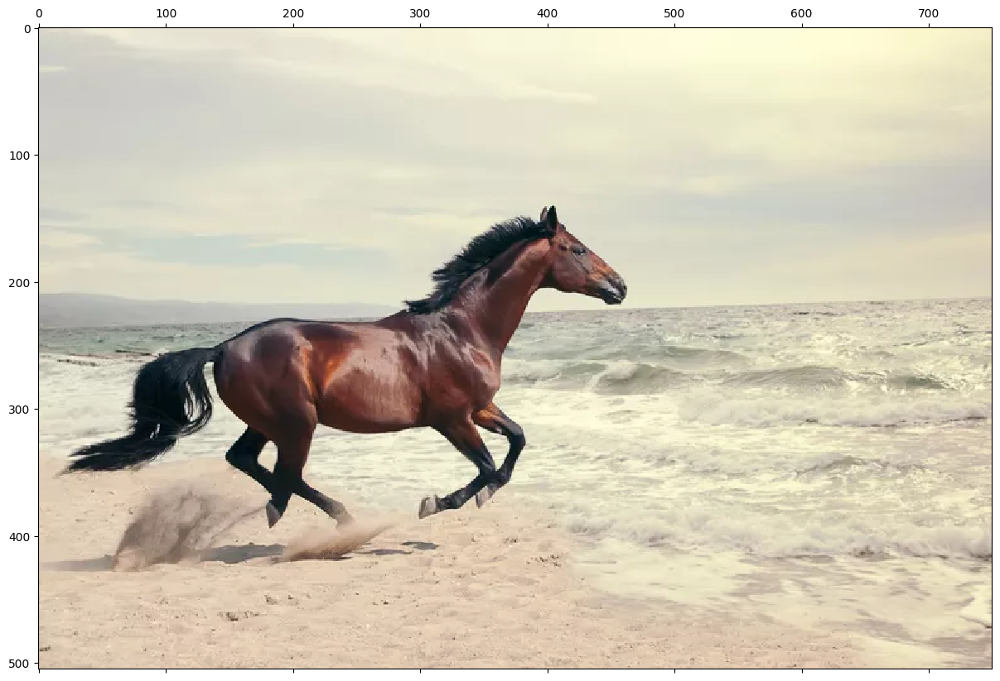

In [ ]:
from PIL import Image
import requests
from io import BytesIO
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10, 10)


response = requests.get(url="https://www.thesprucepets.com/thmb/1kjJEzrw3adUl0TIOWuf24s5VPw=/750x0/filters:no_upscale():max_bytes(150000):strip_icc():format(webp)/GettyImages-909948608-5c69cd9446e0fb0001560d1a.jpg")
img = Image.open(BytesIO(response.content))


plt.matshow(img)

In [ ]:
horse = np.array(img)
print(horse.shape)

(505, 750, 3)


The image should be transformed.
* Select a region
* Cut out a part
* Resize

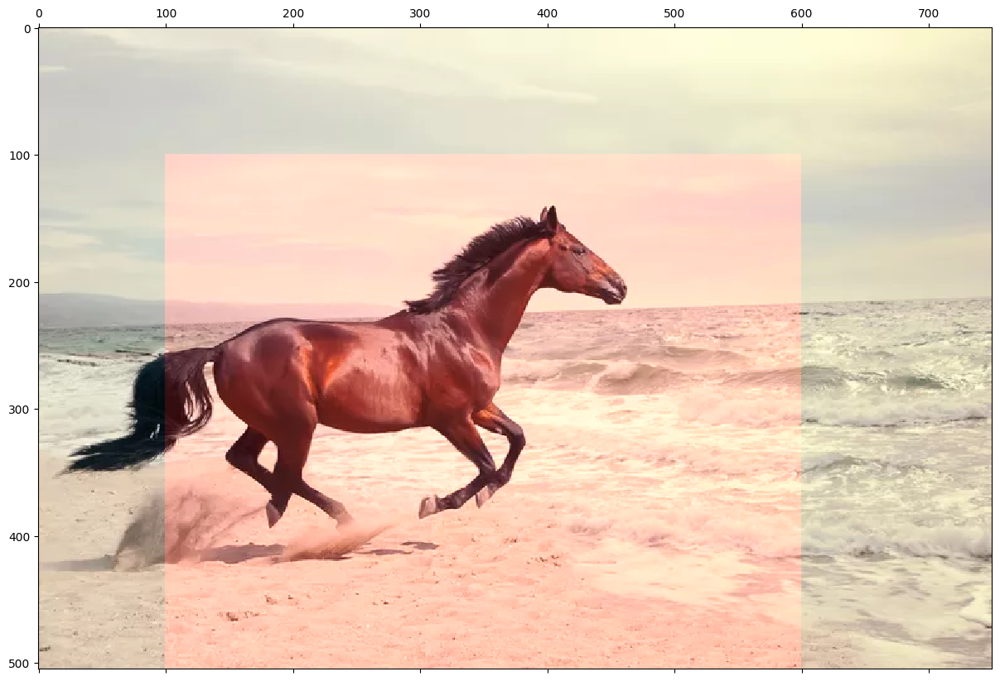

In [ ]:
# To see which part will be delivered to the classifier...

horse[100:600,100:600,0] = np.clip(horse[100:600,100:600,0],0,205)
horse[100:600,100:600,0]+=50
plt.matshow(horse)

In [ ]:
from keras import layers
X = horse[100:600,100:600,:]
resize = layers.Resizing(300,300)
X=resize(X).numpy()
print(X.shape)


(300, 300, 3)


Classify

In [ ]:
X_as_batch = X.reshape(1,300,300,3)
preds = model.predict(X_as_batch)
print(preds)
y_pred = np.argmax(preds,axis=1)
print(f'Predicted:{y_pred}')

1/1 [==============================] - 0s 94ms/step
[[0.44244465 0.5575554 ]]
Predicted:[1]


Display activations

1/1 [==============================] - 0s 46ms/step
-----


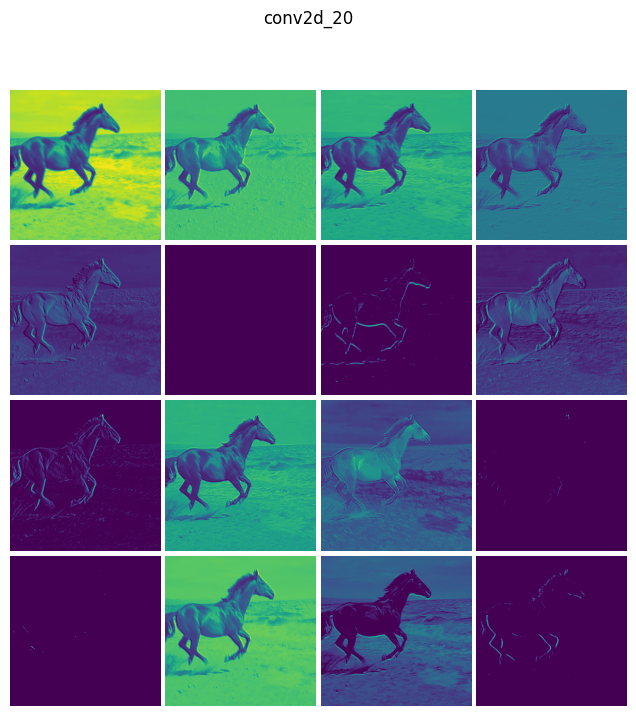

-----


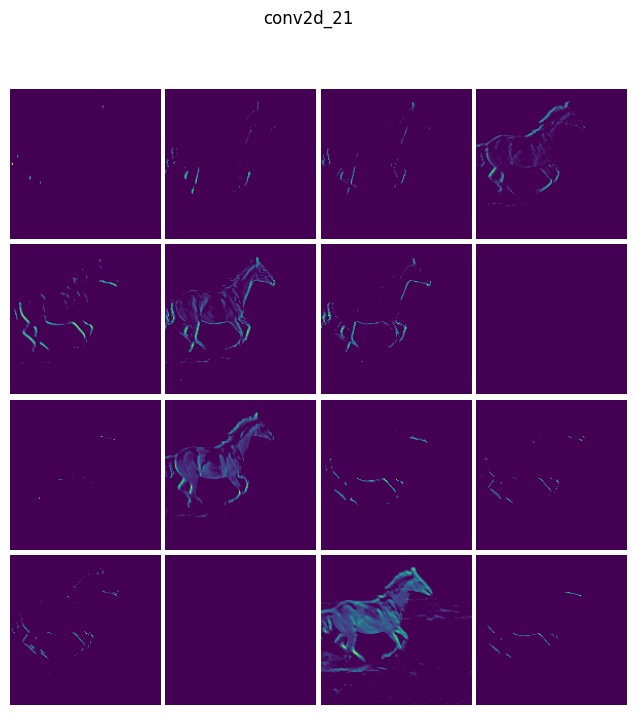

-----


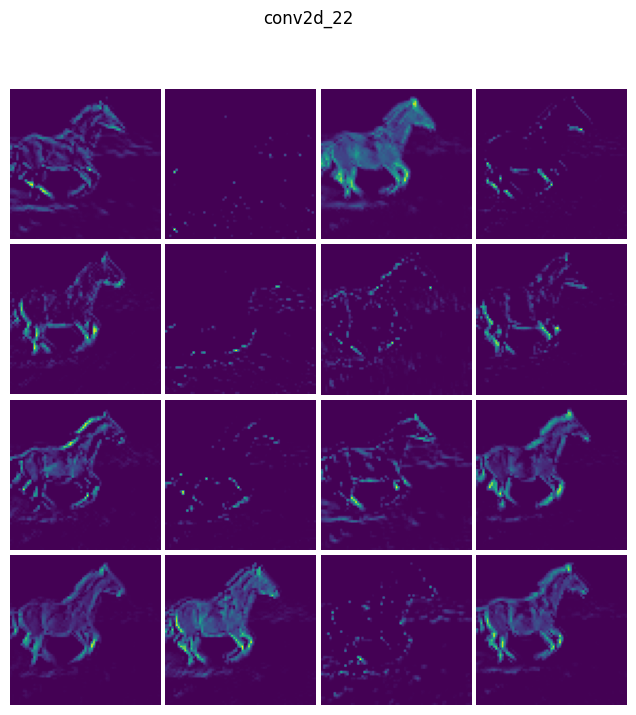

In [ ]:
activations = activation_model.predict(X_as_batch)
display(activations[0],grid_shape=(4,4),title=layer_names[0])
display(activations[3],grid_shape=(4,4),title=layer_names[3])
display(activations[6],grid_shape=(4,4),title=layer_names[6])
# etc

## 5.2.2 Test on a human

**TODO 5.2.3** Select and load a photo of a human, perform classification and display activations

The first image seems similar to these in the training set

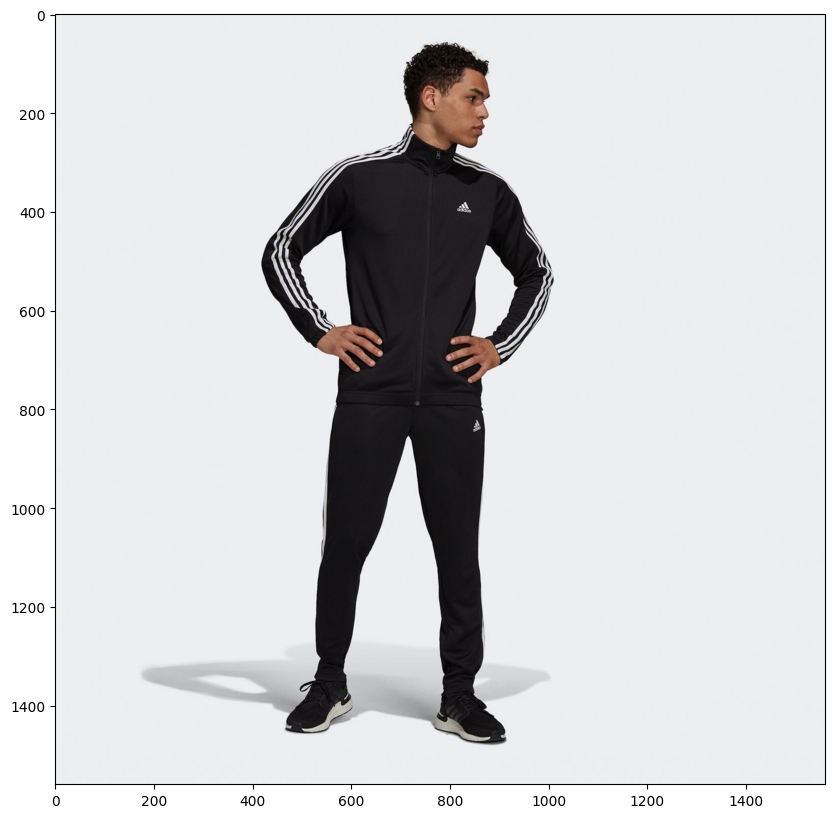

In [ ]:
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10, 10)

response = requests.get(url = "https://www.snipes.pl/dw/image/v2/BDCB_PRD/on/demandware.static/-/Sites-snse-master-eu/default/dwf0cd269a/1966589_P.jpg?sw=1560&sh=1560&sm=fit&sfrm=png")
img = Image.open(BytesIO(response.content))
plt.imshow(img)

The second might be more demanding...

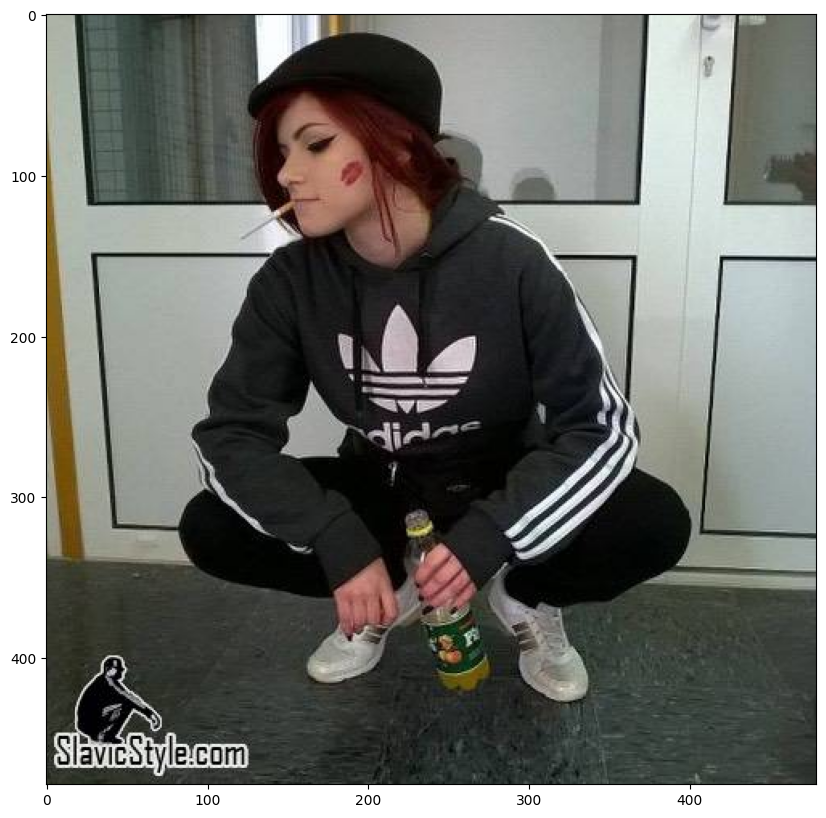

In [ ]:
response = requests.get(url = "https://preview.redd.it/fhwzjxn8a0r41.jpg?auto=webp&s=c27256849d4ccaa8e8d69df546462276e852af1c")
img = Image.open(BytesIO(response.content))
plt.imshow(img)

In [ ]:
image = np.array(img)
print(image.shape)

(479, 479, 3)


In [ ]:
from keras import layers
resize = layers.Resizing(300,300)
X=resize(image).numpy()
print(X.shape)

(300, 300, 3)


In [ ]:
X_as_batch = X.reshape(1,300,300,3)
preds = model.predict(X_as_batch)
print(preds)
y_pred = np.argmax(preds,axis=1)
print(f'Predicted:{y_pred}')

1/1 [==============================] - 0s 19ms/step
[[1.7761790e-04 9.9982244e-01]]
Predicted:[1]


Display activations

1/1 [==============================] - 0s 20ms/step
-----


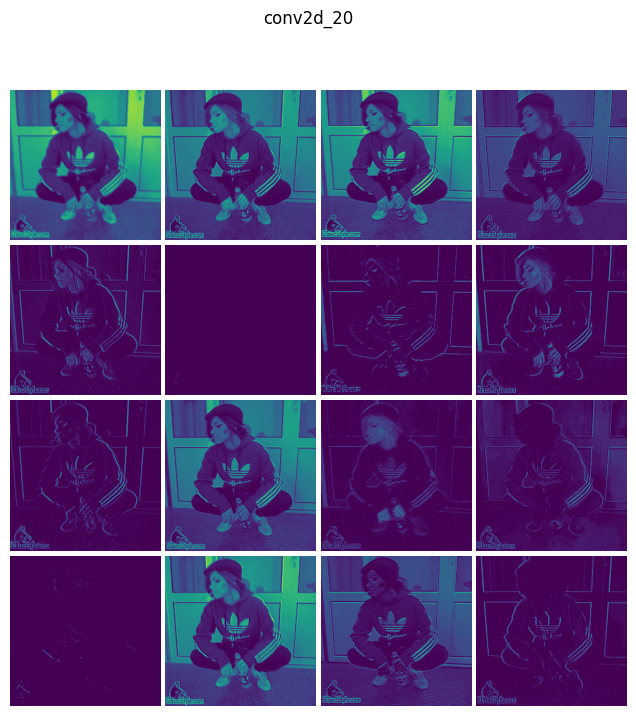

-----


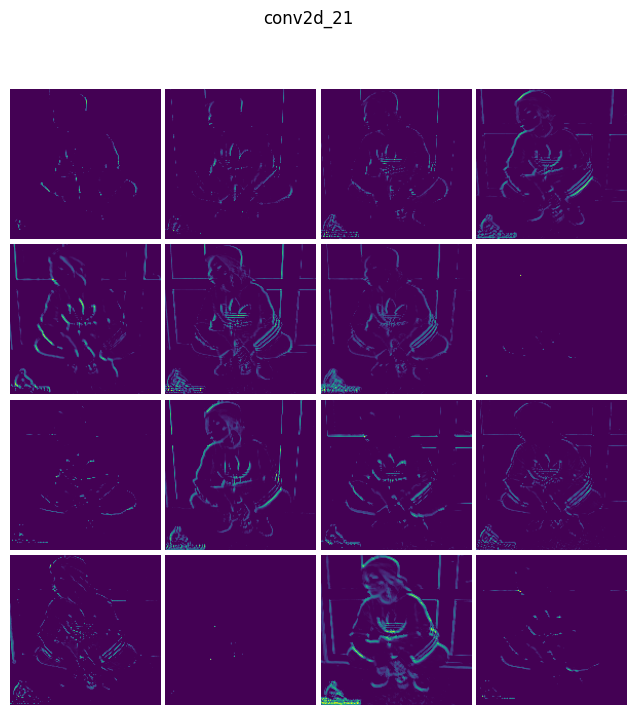

-----


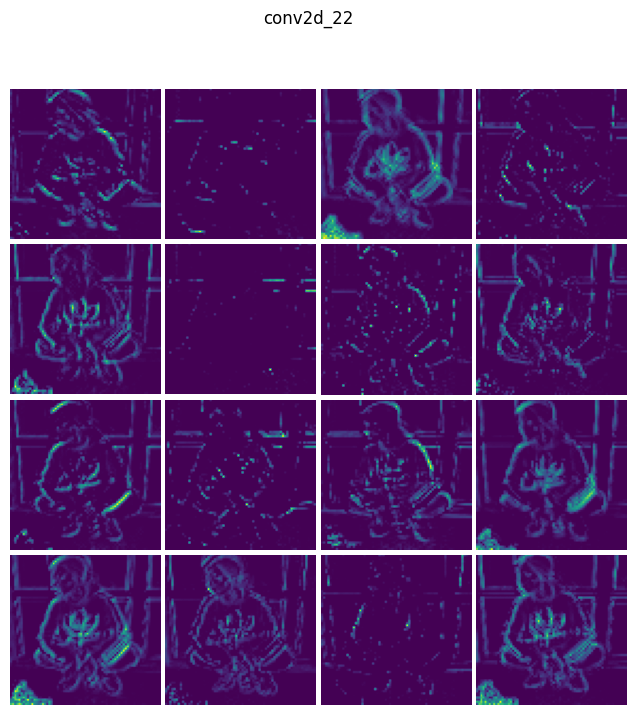

In [ ]:
activations = activation_model.predict(X_as_batch)
display(activations[0],grid_shape=(4,4),title=layer_names[0])
display(activations[3],grid_shape=(4,4),title=layer_names[3])
display(activations[6],grid_shape=(4,4),title=layer_names[6])
# etc

# 5.3 Visualize filters

The goal is to find pixel values and locations that contribute the most to activations of a given layer.

This is an optimization problem.
*  Let $X$ be an image (3D input array)
*  Let $f(X)_i$ be an output of a particular $i$-th filter
*  Let $F( f(X)_i )$ be a goal function to be optimized

The maximum filter response occurs if the input is equal $X^* = \text{arg}\,\max\limits_{X}\, F( f(X)_i )$


**Remark** The code below is not executed in the eager mode. Please restart the execution environment and reload the model.

In [ ]:
import tensorflow as tf
from keras import backend as K
tf.compat.v1.disable_eager_execution()

from keras.models import load_model
model = load_model('/content/my_model.h5')

model.summary()



Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 298, 298, 16)      448       
                                                                 
 max_pooling2d_20 (MaxPooli  (None, 149, 149, 16)      0         
 ng2D)                                                           
                                                                 
 dropout_24 (Dropout)        (None, 149, 149, 16)      0         
                                                                 
 conv2d_21 (Conv2D)          (None, 147, 147, 16)      2320      
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 73, 73, 16)        0         
 ng2D)                                                           
                                                                 
 dropout_25 (Dropout)        (None, 73, 73, 16)      

In [ ]:
layer_name = 'conv2d_20'
filter_index = 0

layer_output = model.get_layer(layer_name).output
goal = K.mean(layer_output[:, :, :, filter_index])

In [ ]:
# The call to `gradients` returns a list of tensors (of size 1 in this case)
# hence we only keep the first element, which is a tensor.
grads = tf.gradients(goal, model.input)[0]
# Then gradients are scaled
grads /= (tf.math.sqrt(K.mean(tf.square(grads))) + 1e-5)

We define compute_goal_grads function.

*As per the Keras/Tensorflow manual, this function [K.function] runs the computation graph that we have created in the code, taking input from the first parameter and extracting the number of outputs as per the layers mentioned in the second parameter.*

In [ ]:
compute_goal_grads = K.function([model.input], [goal, grads])

# Let's test it:
import numpy as np
goal_value, grads_value = compute_goal_grads([np.zeros((1, 300, 300, 3))])
print(goal_value)

0.0


Simple implementation of gradient ascent algorithm (suitable for maximization)

In [ ]:
# We start from a gray image with some noise
input_img_data = np.random.random((1, 300, 300, 3)) * 20 + 128.

# Run gradient ascent for 40 steps
step = 1.  # this is the magnitude of each gradient update
for i in range(40):
    # Compute the loss value and gradient value
    goal_value, grads_value = compute_goal_grads([input_img_data])
    # Here we adjust the input image in the direction that maximizes the loss
    input_img_data += grads_value * step

In [ ]:
def convert_to_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

Finally, we arrange this into a function

In [ ]:
def generate_pattern(layer_name, filter_index, size=100):
    # Build a loss function that maximizes the activation of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    goal = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture with this loss
    grads = K.gradients(goal, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the goal and grads given the input picture
    compute_goal_grads = K.function([model.input], [goal, grads])

    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        goal_value, grads_value = compute_goal_grads([input_img_data])
        input_img_data += grads_value * step

    img = input_img_data[0]
    return convert_to_image(img)

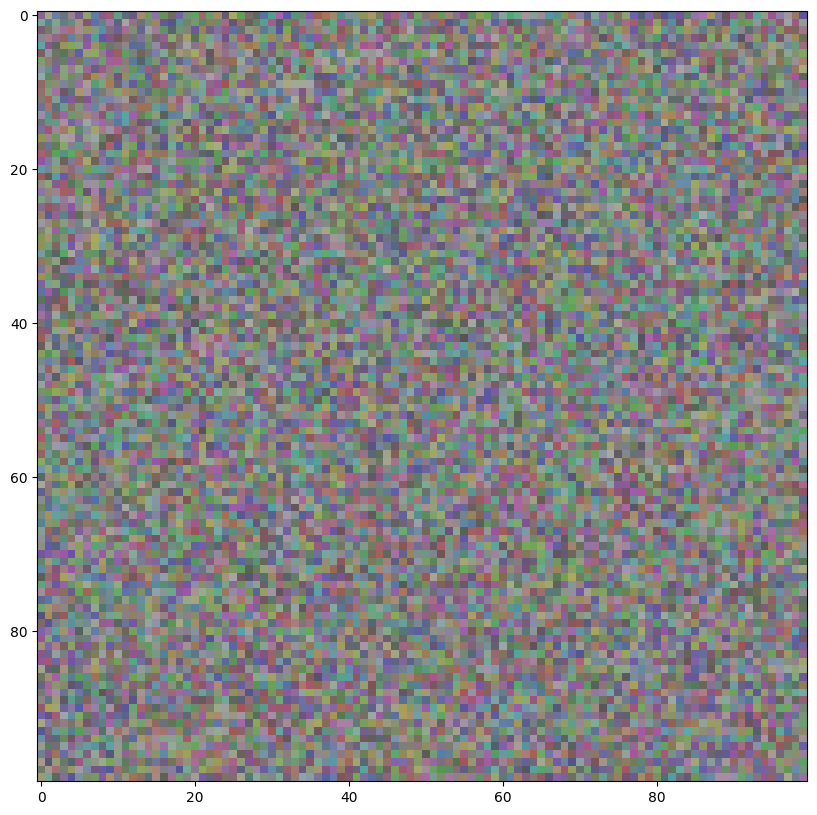

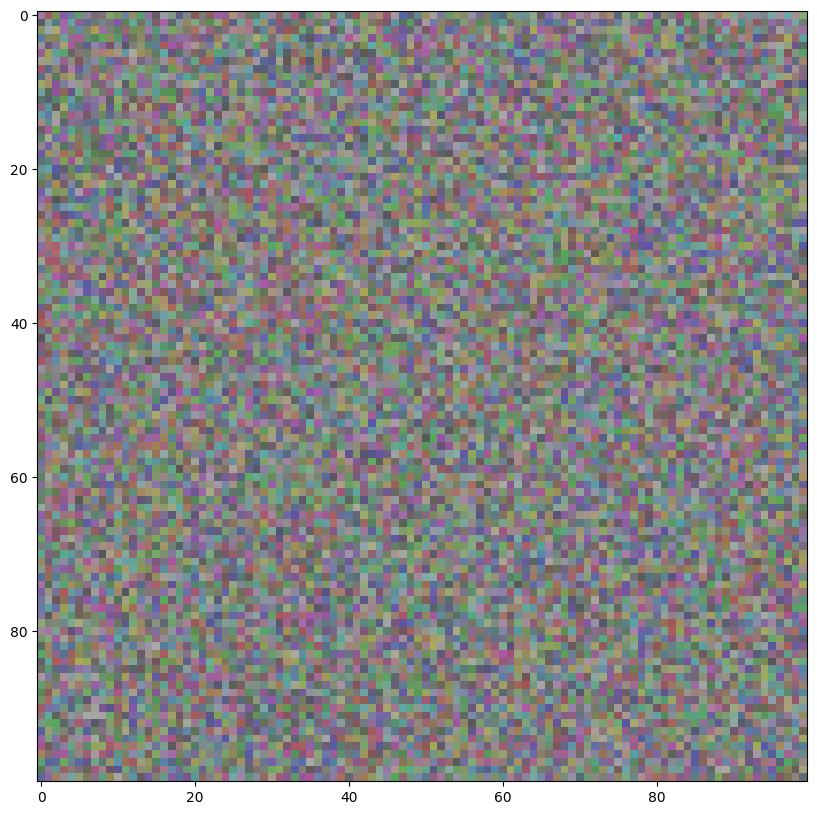

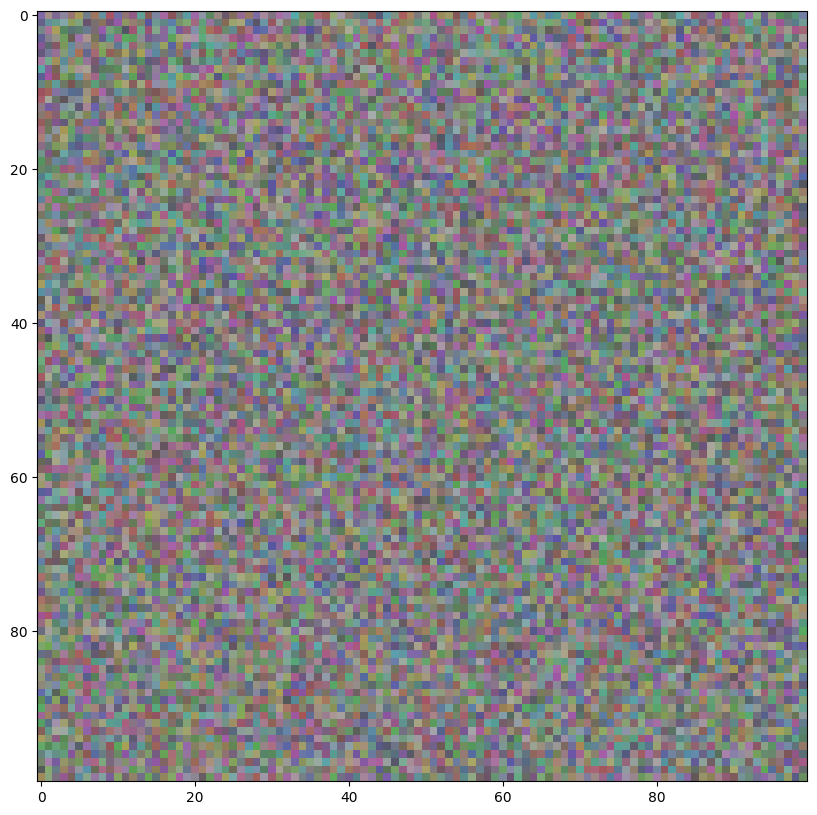

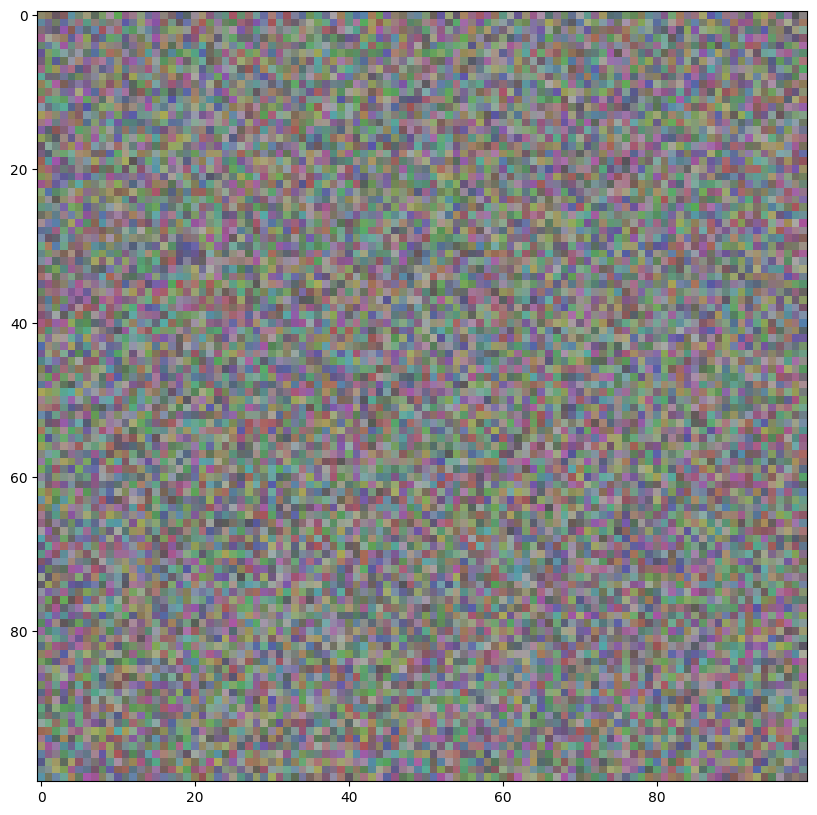

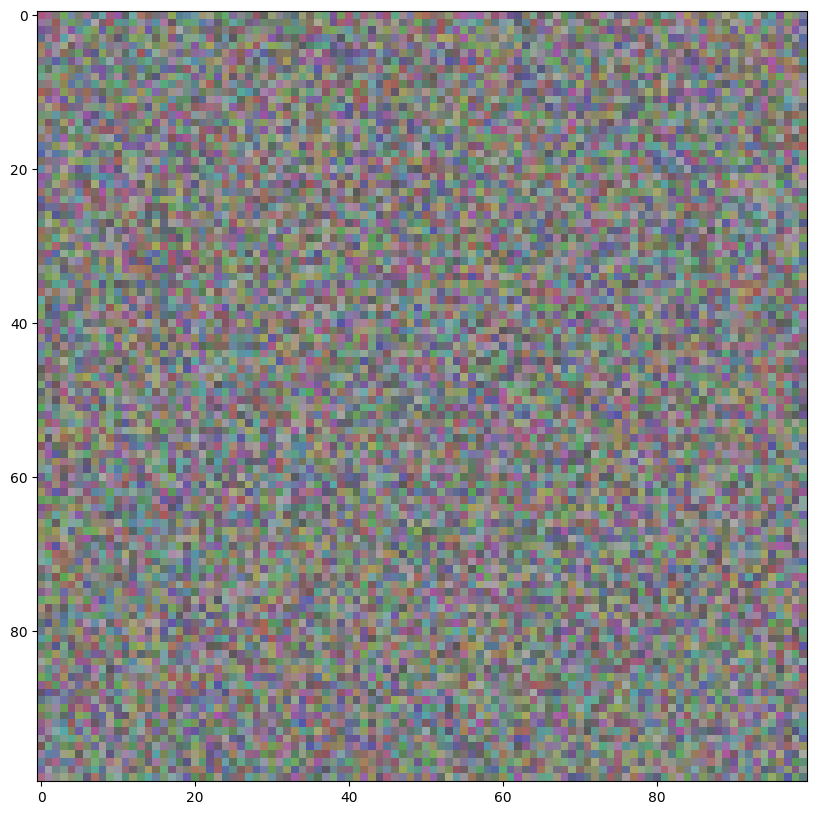

...

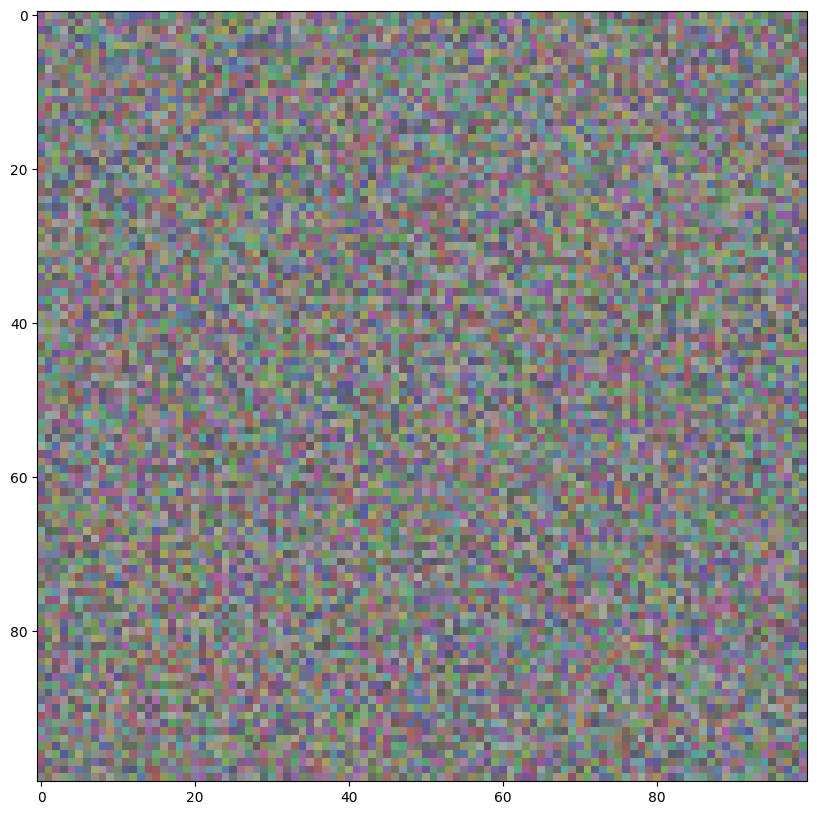

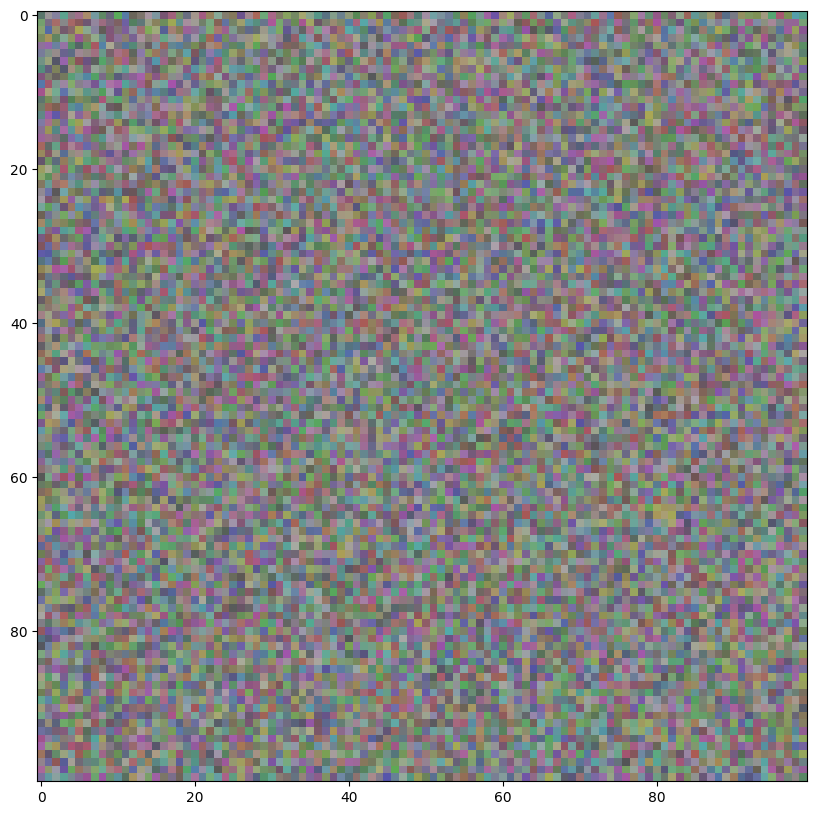

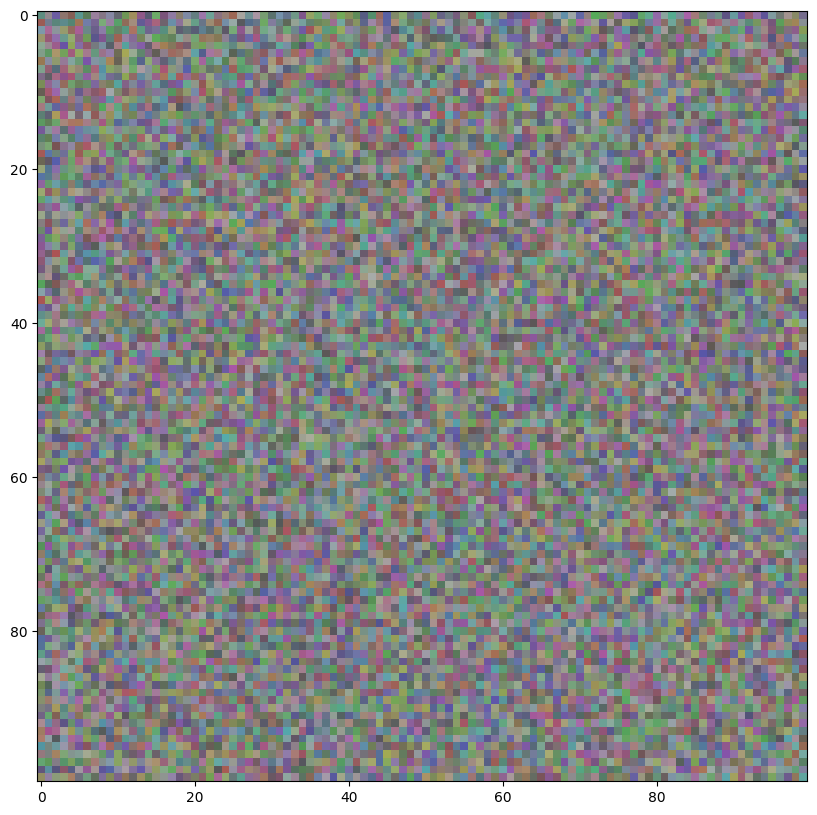

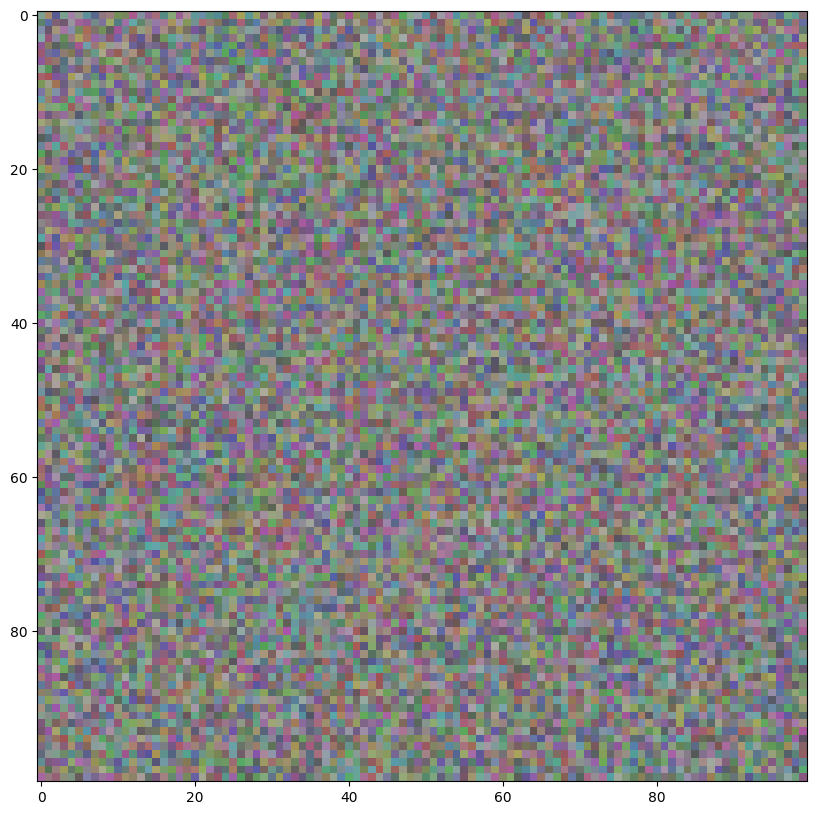

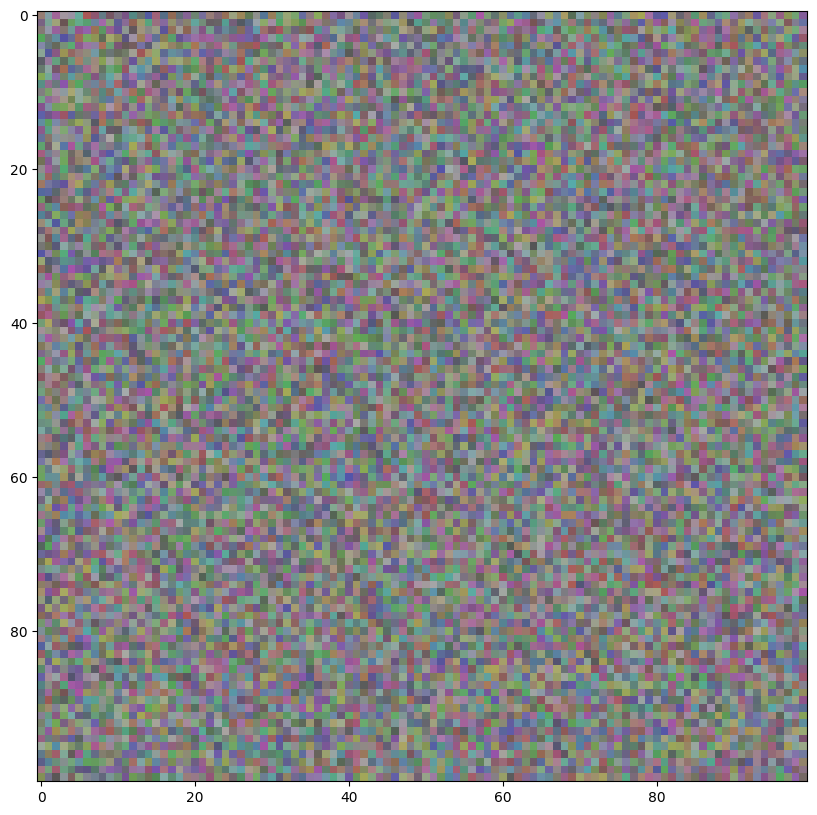

In [ ]:
import matplotlib.pyplot as plt
for i in range(16):
    plt.imshow(generate_pattern('conv2d_24', i))
    plt.show()

Visualization of several filters

Layer name: conv2d_24


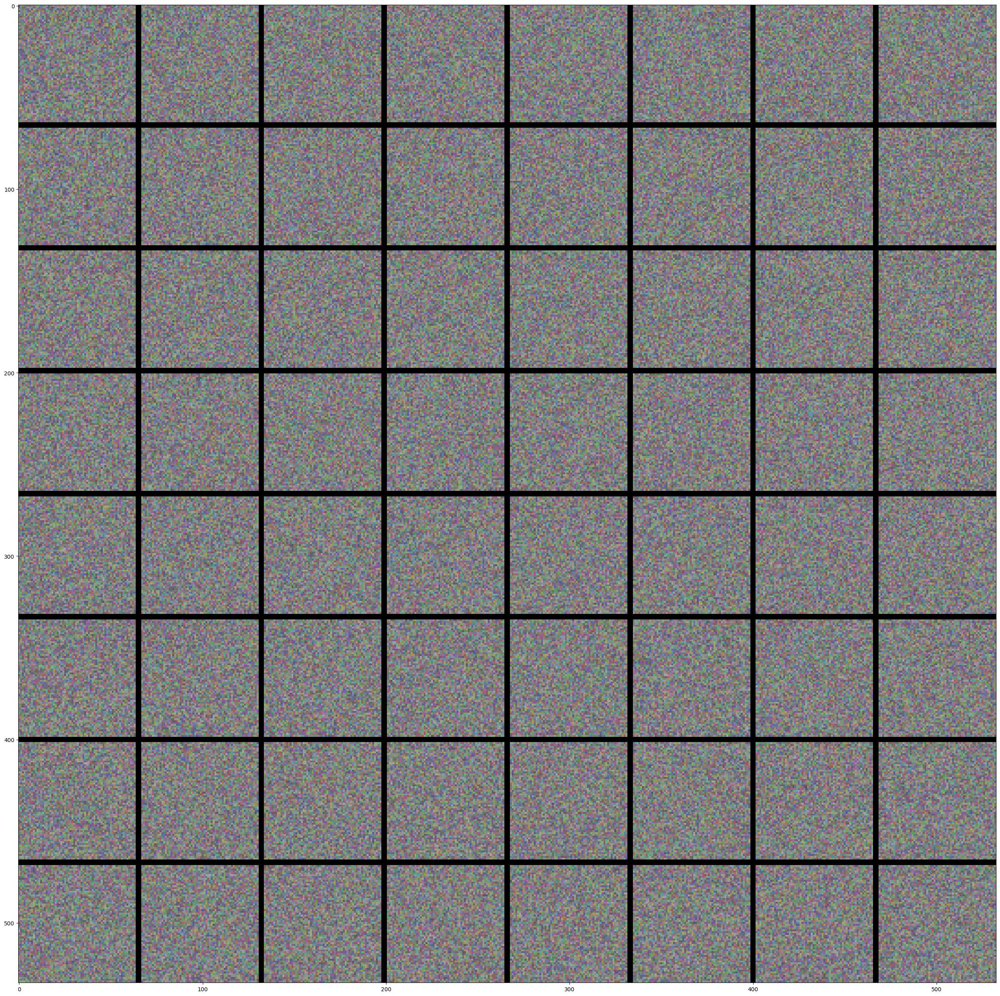

In [ ]:
size = 64
margin = 3
no = 8

for layer_name in [ 'conv2d_24',]:

    # This a empty (black) image where we will store our results.
    results = np.zeros((no * size + 7 * margin, no * size + 7 * margin, 3), dtype=np.uint8)

    for i in range(no):  # iterate over the rows of our results grid
        for j in range(no):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * no)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * no), size=size)
            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start : horizontal_end, vertical_start : vertical_end, : ] = filter_img

    # Display the results grid
    print("Layer name: " + layer_name)
    plt.figure(figsize=(size / 2, size / 2))
    plt.imshow(results)
    plt.show()

Visualization of VGG16 filters response is much more appealing, because the network was trained on 1.2M images. However, some patterns can be also observed for this model.

Observe the effect of padding (lack of padding). Regions at the borders do not contribute. Many filters just produce noise.

**TODO 5.3.1** Visualize filters in a selected layer of your model.

Layer name: conv2d_24


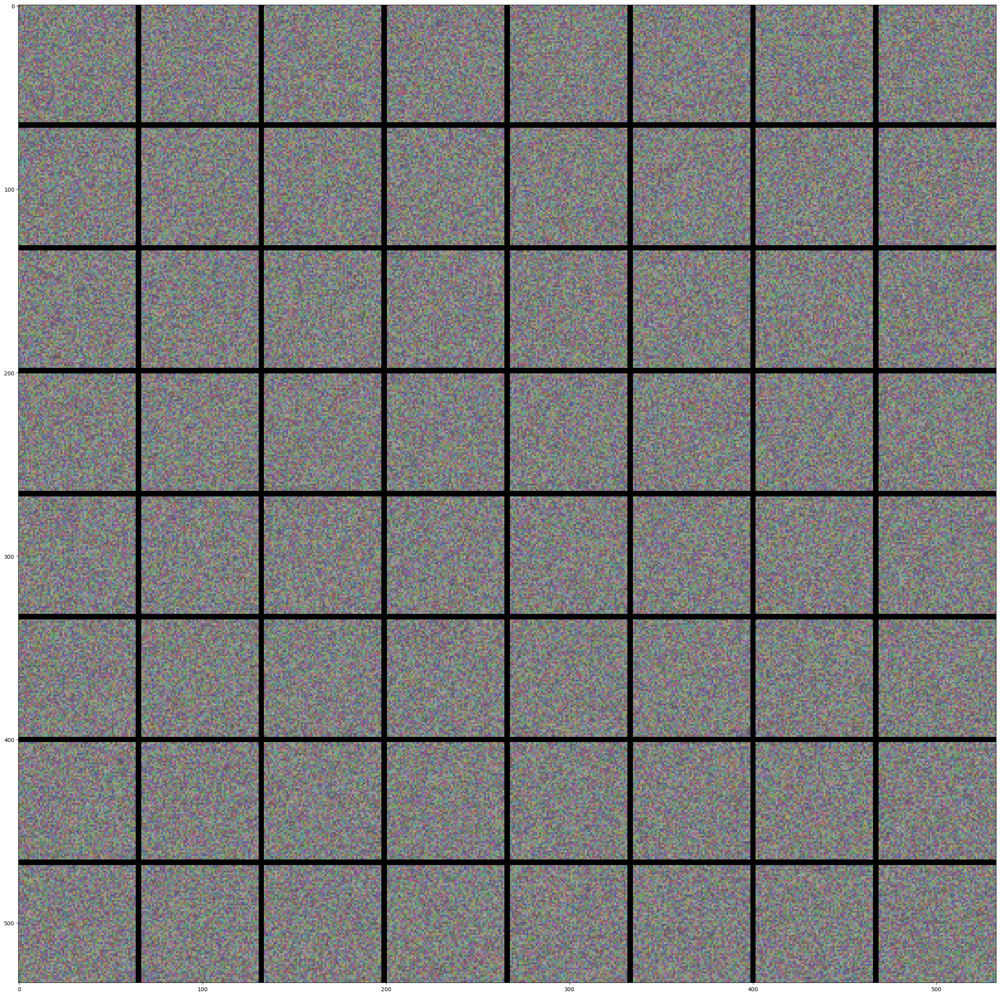

In [ ]:
size = 64
margin = 3
no = 8

results = np.zeros((no * size + 7 * margin, no * size + 7 * margin, 3), dtype=np.uint8)

for i in range(no):  # iterate over the rows of our results grid
    for j in range(no):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * no)` in `layer_name`
        filter_img = generate_pattern('conv2d_24', i + (j * no), size=size)
            # Put the result in the square `(i, j)` of the results grid
        horizontal_start = i * size + i * margin
        horizontal_end = horizontal_start + size
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        results[horizontal_start : horizontal_end, vertical_start : vertical_end, : ] = filter_img

    # Display the results grid
print("Layer name: " + 'conv2d_24')
plt.figure(figsize=(size / 2, size / 2))
plt.imshow(results)
plt.show()

# 5.4 Heatmaps

Heatmaps are used to mark parts of the image that contributed the most to the final classifier decision.

**Algorithm**
1. Select an image
2. Classify it
3. Select a neuron $y_k$ corresponding to the predicted class label
4. Select $z$ an output of a convolutional layer. Tensor $z$ has the shape: $h\times w \times d$, where $d$ (depth) corresponds to the number of filters
4. Compute gradients $\frac{dy_k}{dz_{i,j,k}}$  
5. Compute how much each filter contributes to the output value - by calculating mean values of gradients for each filter (pooled_gradients). The vector size is equal to $d$.
6. Pooled gradients act as weights. Multiply $z$ by pooled_gradients and compute means along the filter axis.

The shape of resulting heatmap matrix is $h\times w$. It can be then scaled to the size of the original image and superimposed. (Actually it works better with padding=same.)

**Remark** The eager mode is disabled.


## 5.4.1 Compute a heatmap

In [ ]:
import tensorflow as tf
from keras import backend as K
tf.compat.v1.disable_eager_execution()
K.clear_session()

**TODO 5.4.1** Load your own model, then use one of the previously processed images.

In [ ]:
from keras.models import load_model
model = load_model('my_model.h5')

model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 298, 298, 16)      448       
                                                                 
 max_pooling2d_20 (MaxPooli  (None, 149, 149, 16)      0         
 ng2D)                                                           
                                                                 
 dropout_24 (Dropout)        (None, 149, 149, 16)      0         
                                                                 
 conv2d_21 (Conv2D)          (None, 147, 147, 16)      2320      
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 73, 73, 16)        0         
 ng2D)                                                           
                                                                 
 dropout_25 (Dropout)        (None, 73, 73, 16)      

In [ ]:
#Load an image
from keras import layers
from PIL import Image
import requests
from io import BytesIO
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10, 10)


response = requests.get(
    url = "https://dziendobry.tvn.pl/_e/i/cdn-zdjecie-qd6stz-fot-natalie-alexeeva-anakonda-eyeem-getty-images/alternates/WEBP_LANDSCAPE_1620"
    )
img = Image.open(BytesIO(response.content))
horse = np.array(img)
print(horse.shape)

#X = horse[100:600,100:600,:]
X = horse[100:450, 0:350, :]
resize = layers.Resizing(300,300)
X=resize(X)

X=tf.reshape(X,(1,300,300,3))
print(X.shape)

(911, 1620, 3)
(1, 300, 300, 3)


Classify and find the activated neuron

In [ ]:
probs = model.predict(X,steps=1)
print (probs)
idx = np.argmax(probs[0])
print(idx)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[[0.53174376 0.46825626]]
0


We will generate heatmap based on the last convolution layer.

In [ ]:
from keras import backend as K
import tensorflow as tf

conv_layer = model.get_layer('conv2d_24')

# compute gradients
grads = K.gradients(model.output[:,0], conv_layer.output)[0]

print(grads.shape)

(None, 14, 14, 64)


Compute pooled_grads

In [ ]:
# This is a vector of shape equal to the number of filters, where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))
print(pooled_grads.shape)

(64,)


In [ ]:
# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of selected convolution layer`,
# given a sample image

get_pgrads_and_cloutput = K.function([model.input], [pooled_grads, conv_layer.output[0]])

Now we compute pooled gradients and layer output for the innput image - the X parameter

In [ ]:
# These are the values of these two quantities, as Numpy arrays,
# given our sample image
pooled_grads_value, conv_layer_output_value = get_pgrads_and_cloutput([X])

In [ ]:
# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the selected class

for i in range(conv_layer_output_value.shape[2]):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]


In [ ]:
# The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)
print(heatmap.shape)

(14, 14)


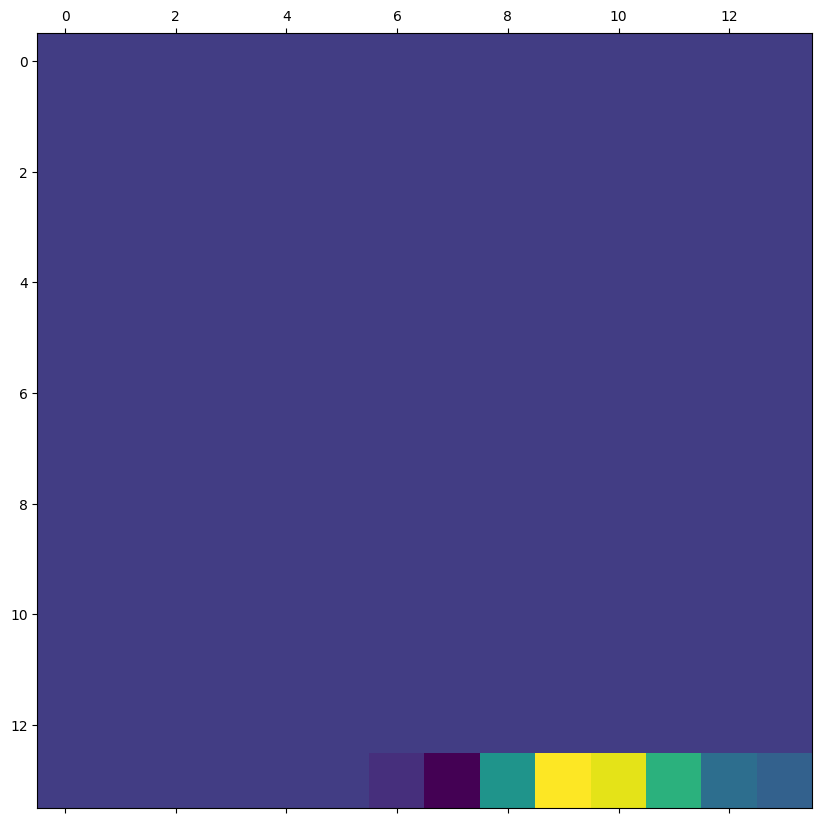

In [ ]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

## 5.4.2 Packing it as a function

In [ ]:
from keras import backend as K
import tensorflow as tf

def get_heatmap(X,layer_name):
  # Predict class label
  probs = model.predict(X,steps=1)
  idx = np.argmax(probs[0])
  conv_layer = model.get_layer(layer_name)
  # compute gradients
  grads = K.gradients(model.output[:,0], conv_layer.output)[0]
  pooled_grads = K.mean(grads, axis=(0, 1, 2))
  get_pgrads_and_cloutput = K.function([model.input], [pooled_grads, conv_layer.output[0]])

  # These are the values of these two quantities, as Numpy arrays,
  # given our sample image
  pooled_grads_value, conv_layer_output_value = get_pgrads_and_cloutput([X])
  # We multiply each channel in the feature map array
  # by "how important this channel is" with regard to the selected class

  for i in range(conv_layer_output_value.shape[2]):
      conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
  # The channel-wise mean of the resulting feature map
  # is our heatmap of class activation
  heatmap = np.mean(conv_layer_output_value, axis=-1)
  heatmap = np.maximum(heatmap, 0)
  heatmap /= np.max(heatmap)
  return heatmap


A function to superimpose heatmap over an image region. Displays both the heatmap and the image. Uses CV2 library.


In [ ]:
import cv2

def superimpose(X,heatmap,y_top=0,y_bottom=None,x_left=0,x_right=None,alpha=0.4):
  if y_bottom is None:
    y_bottom = X.shape[0]
  if x_right is None:
    x_right = X.shape[1]

  w = x_right - x_left
  h = y_bottom - y_top
  heatmap = cv2.resize(heatmap, (w, h))
  heatmap = np.uint8(255 * heatmap)
  heatmap = np.clip(heatmap,0,255)

  # We apply the heatmap to the original image
  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_HOT)
  plt.matshow(heatmap)
  plt.show()

  X2=np.array(X)
  print(heatmap.shape)
  print(X2.shape)
  X2[y_top:y_bottom,x_left:x_right] = heatmap * alpha + X2[y_top:y_bottom,x_left:x_right]*(1-alpha)
  plt.imshow(X2)
  plt.show()


**TODO 5.4.1** Display heatmaps of all convolutional layers using your model and the selected image.

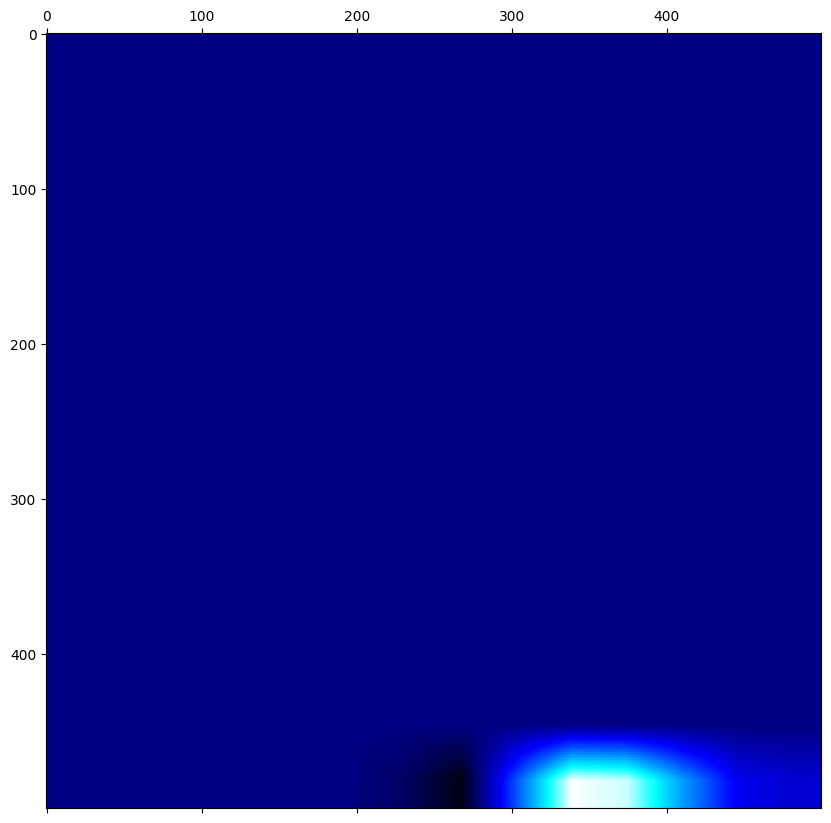

(500, 500, 3)
(911, 1620, 3)


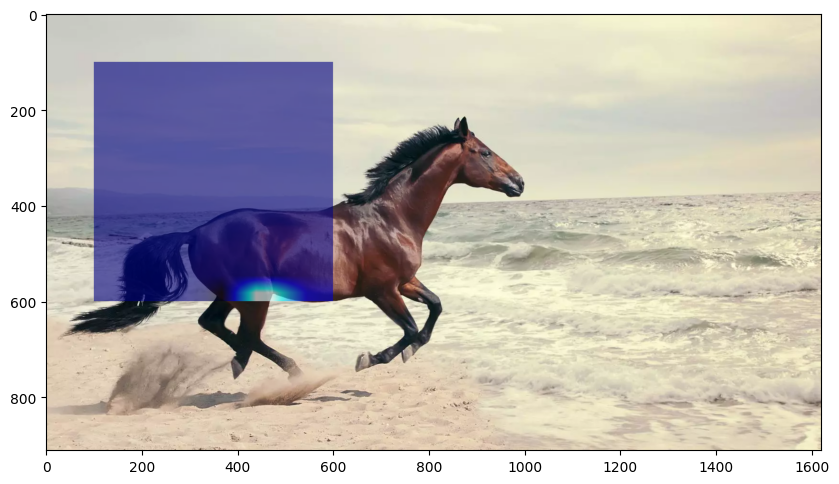

In [ ]:
heatmap = get_heatmap(X,'conv2d_24')
superimpose(horse,heatmap,y_top=100,y_bottom=600,x_left=100,x_right=600,alpha=.6)


**Disclaimer** Due to the padding and maxpooling, regions probably should be a little bit corrected.

In [ ]:
(300-14*2*2*2*2)/2

38.0

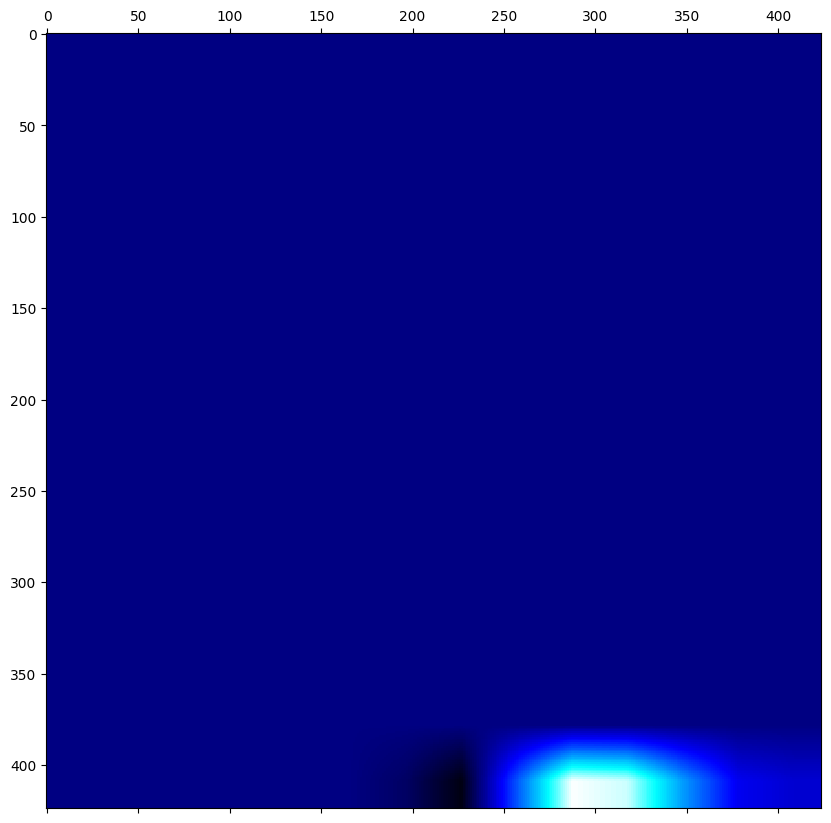

(424, 424, 3)
(911, 1620, 3)


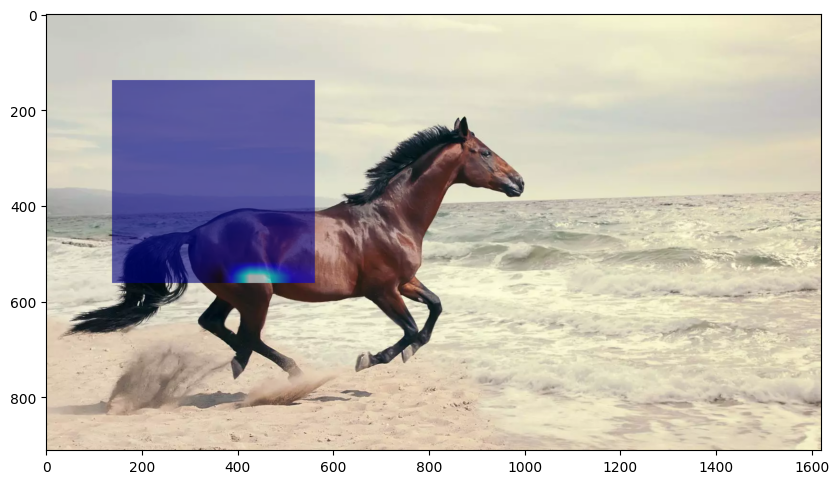

In [ ]:
heatmap = get_heatmap(X,'conv2d_24')
superimpose(horse,heatmap,y_top=100+38,y_bottom=600-38,x_left=100+38,x_right=600-38,alpha=.6)

This legs position is not quite human.

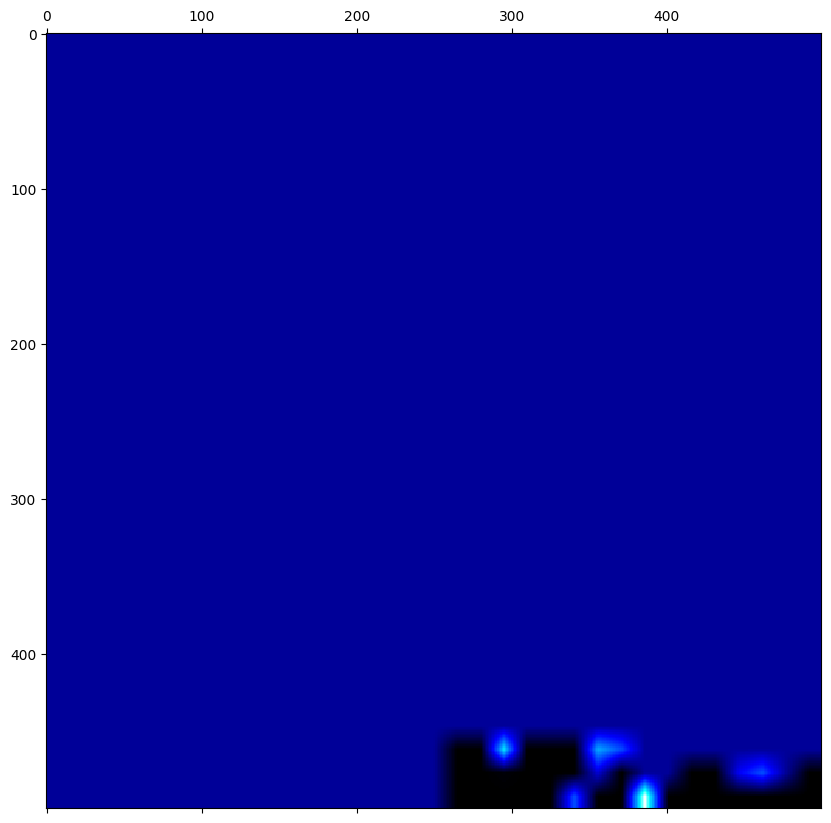

(500, 500, 3)
(911, 1620, 3)


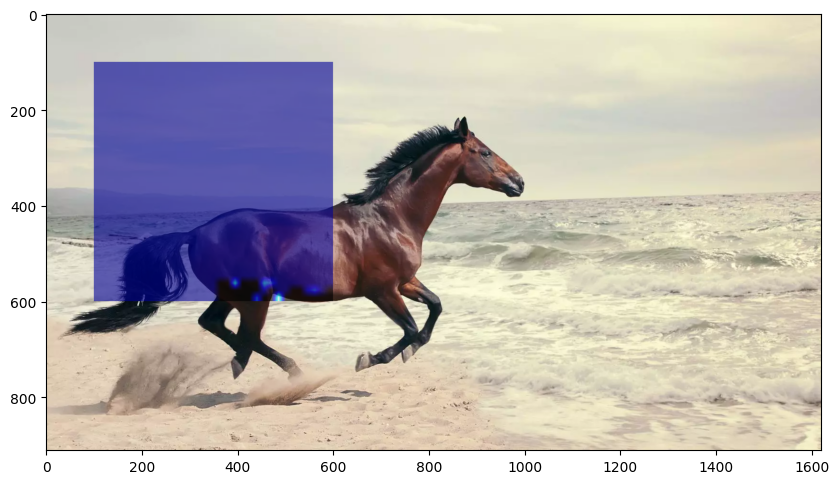

In [ ]:
heatmap = get_heatmap(X,'conv2d_23')
superimpose(horse,heatmap,y_top=100,y_bottom=600,x_left=100,x_right=600,alpha=.6)

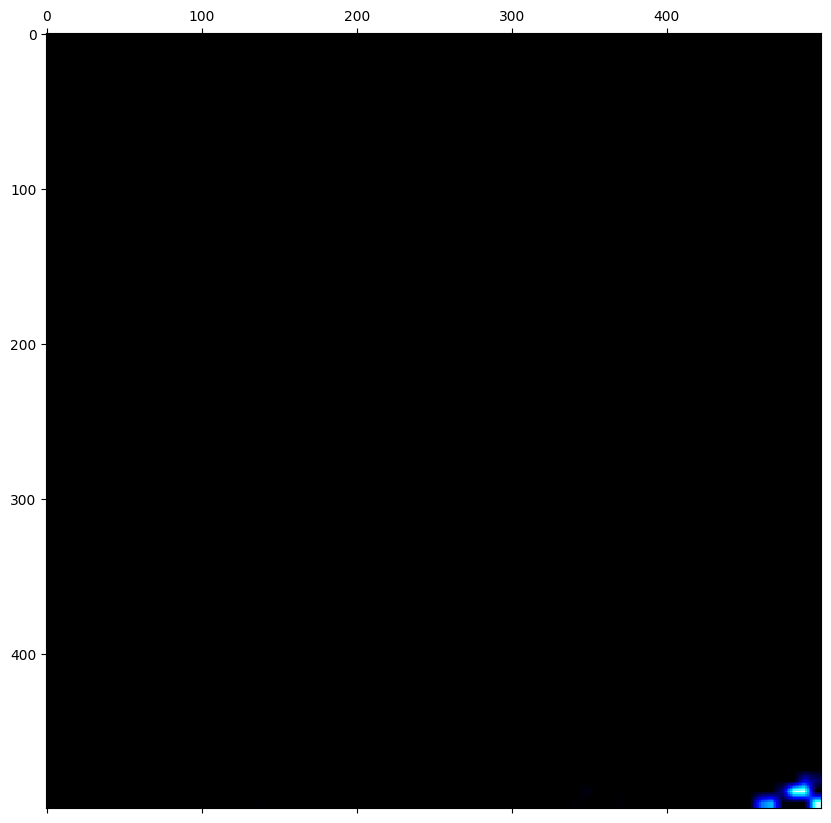

(500, 500, 3)
(911, 1620, 3)


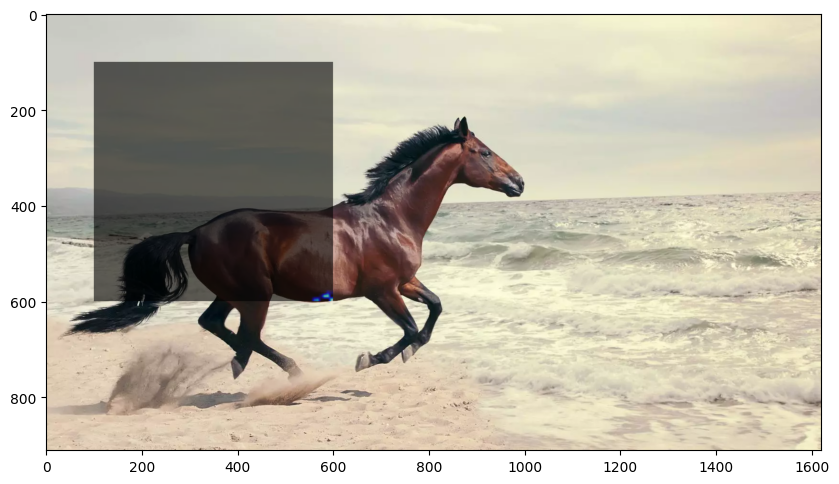

In [ ]:
heatmap = get_heatmap(X,'conv2d_22')
superimpose(horse,heatmap,y_top=100,y_bottom=600,x_left=100,x_right=600,alpha=.6)

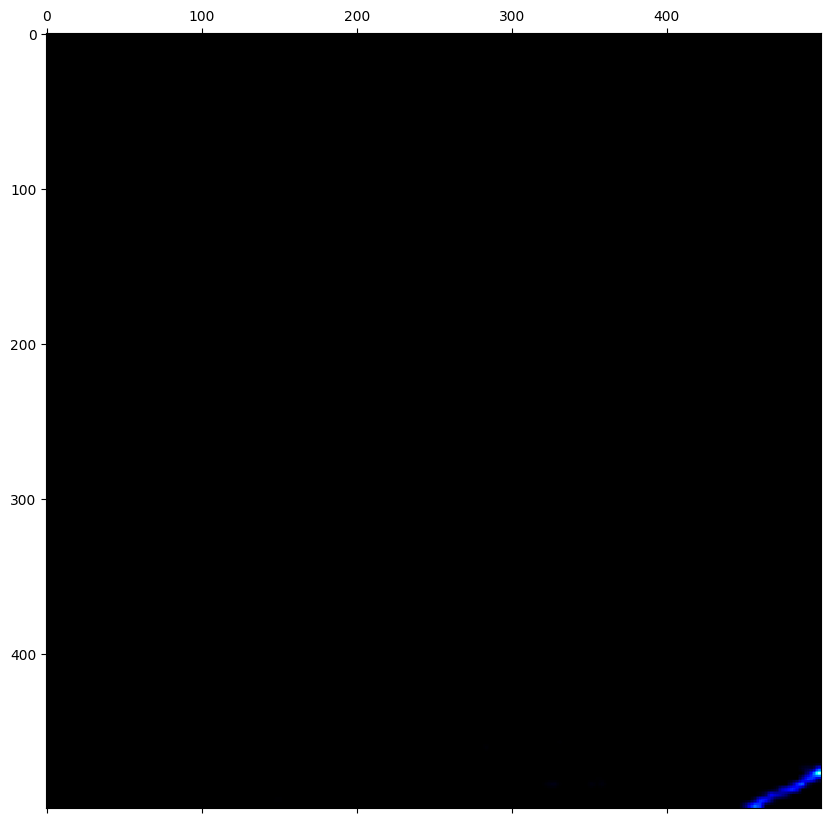

(500, 500, 3)
(911, 1620, 3)


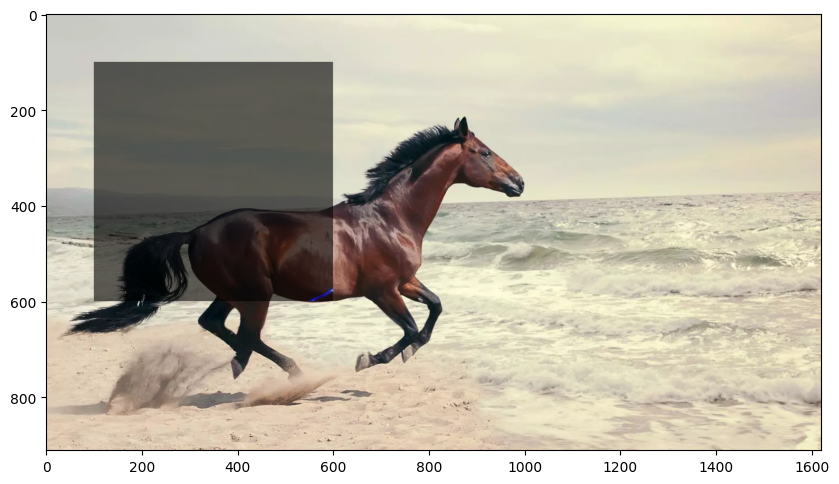

In [ ]:
heatmap = get_heatmap(X,'conv2d_21')
superimpose(horse,heatmap,y_top=100,y_bottom=600,x_left=100,x_right=600,alpha=.6)

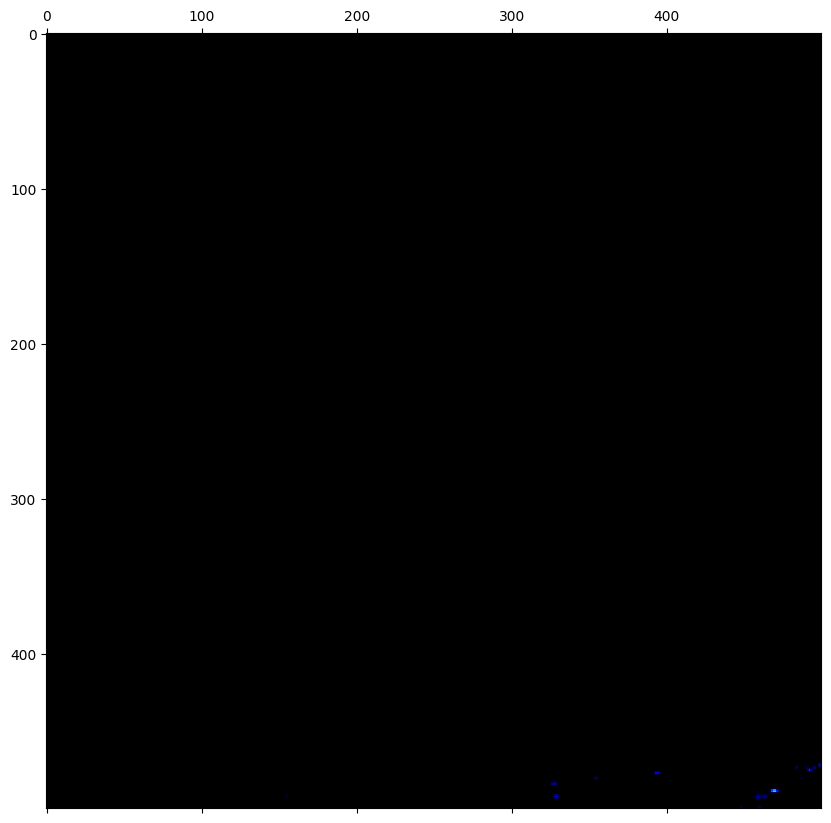

(500, 500, 3)
(911, 1620, 3)


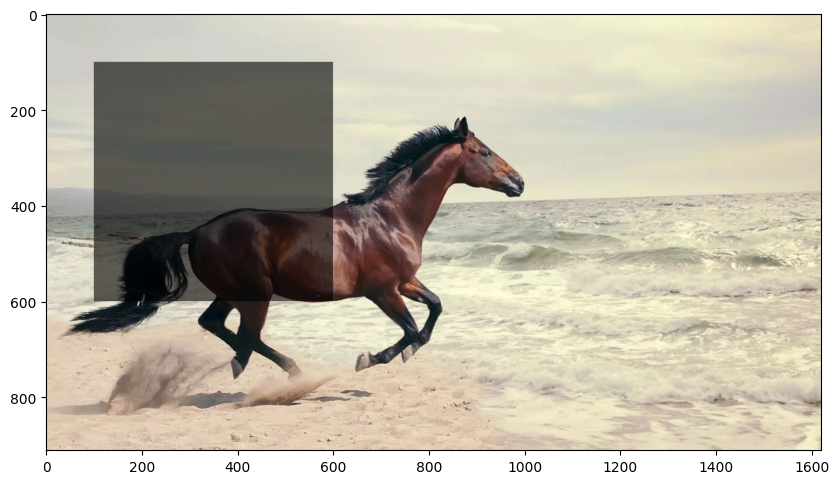

In [ ]:
heatmap = get_heatmap(X,'conv2d_20')
superimpose(horse,heatmap,y_top=100,y_bottom=600,x_left=100,x_right=600,alpha=.6)